<h1>LSTM TASK</h1><br>

1. Preprocess all the Data we have in DonorsChoose Dataset.<br>
2. Combine 4 essay's into one column named - 'preprocessed_essays'.<br> 
3. After step 2  train 3 types of models as discussed below. <br>
4. For all the model use 'auc' as a metric. <br>
5. For all the model's use TensorBoard and plot the Metric value and Loss with epoch.<br>
8. Use Categorical Cross Entropy as Loss to minimize.<br>

# MODEL 1

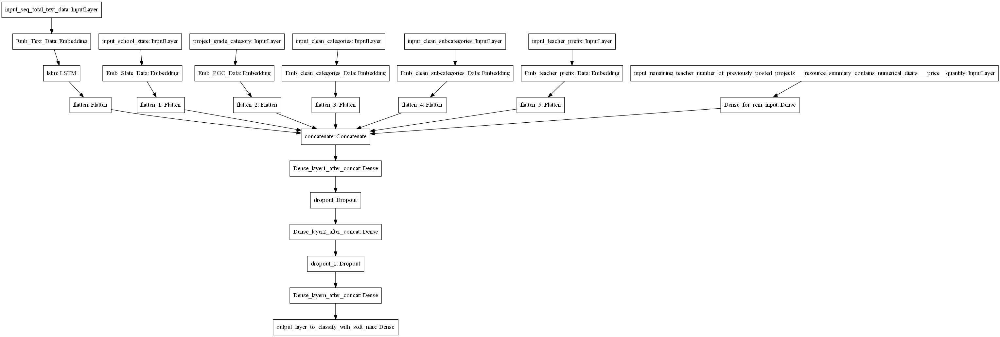

In [3]:
from PIL import Image
import requests
from io import BytesIO
#ref :https://i.imgur.com/w395Yk9.png
response = requests.get('https://i.imgur.com/w395Yk9.png')
Image.open(BytesIO(response.content))

# Model 2

Use the same model as above but for 'input_seq_total_text_data' give only some words in the sentance not all the words. Filter the words as:<br>
1.Train the TF-IDF on the Train data<br> 

2. Get the idf value for each word we have in the train data. <br>

3. Remove the low idf value and high idf value words from our data.<br> 
4. Train the LSTM after removing the Low and High idf value words.<br>

# Model 3

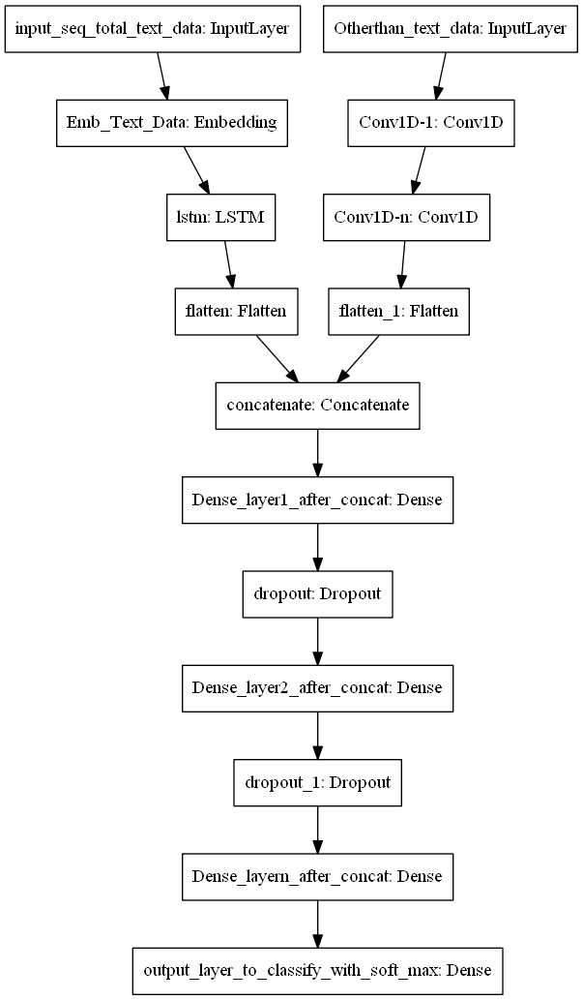

In [5]:
response = requests.get('https://i.imgur.com/fkQ8nGo.png')
Image.open(BytesIO(response.content))

In [0]:
%load_ext tensorboard

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
import pandas as pd
data=pd.read_csv('/content/drive/My Drive/preprocessed_data.csv',engine='python')
data.head()

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03
2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00
3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04
4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74


In [4]:
from sklearn.model_selection import train_test_split
Y=data['project_is_approved']
X=data.drop(['project_is_approved'],axis=1)

x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.3,random_state=2)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)


(76473, 8)
(32775, 8)
(76473,)
(32775,)


In [0]:
import numpy as np

# https://jovianlin.io/embeddings-in-keras/
def load_glove_embeddings(fp, embedding_dim, include_empty_char=True):
    """
    Loads pre-trained word embeddings (GloVe embeddings)
        Inputs: - fp: filepath of pre-trained glove embeddings
                - embedding_dim: dimension of each vector embedding
                - generate_matrix: whether to generate an embedding matrix
        Outputs:
                - word2coefs: Dictionary. Word to its corresponding coefficients
                - word2index: Dictionary. Word to word-index
                - embedding_matrix: Embedding matrix for Keras Embedding layer
    """
    # First, build the "word2coefs" and "word2index"
    word2coefs = {} # word to its corresponding coefficients
    word2index = {} # word to word-index
    with open(fp) as f:
        for idx, line in enumerate(f):
            try:
                data = [x.strip().lower() for x in line.split()]
                word = data[0]
                coefs = np.asarray(data[1:embedding_dim+1], dtype='float32')
                word2coefs[word] = coefs
                if word not in word2index:
                    word2index[word] = len(word2index)
            except Exception as e:
                print('Exception occurred in `load_glove_embeddings`:', e)
                continue
        # End of for loop.
    # End of with open
    if include_empty_char:
        word2index[''] = len(word2index)
    # Second, build the "embedding_matrix"
    # Words not found in embedding index will be all-zeros. Hence, the "+1".
    vocab_size = len(word2coefs)+1 if include_empty_char else len(word2coefs)
    embedding_matrix = np.zeros((vocab_size, embedding_dim))
    for word, idx in word2index.items():
        embedding_vec = word2coefs.get(word)
        if embedding_vec is not None and embedding_vec.shape[0]==embedding_dim:
            embedding_matrix[idx] = np.asarray(embedding_vec)
    # return word2coefs, word2index, embedding_matrix
    return word2index, np.asarray(embedding_matrix)

In [0]:
word2index, embedding_matrix = load_glove_embeddings('/content/drive/My Drive/glove.6B.300d.txt', embedding_dim=300)

In [0]:
import re
def custom_tokenize(docs):
    output_matrix = []
    for d in docs:
        indices = []
        for w in d.split():
          if w in word2index.keys():
            indices.append(word2index[w])
        output_matrix.append(indices)
    return output_matrix
text_encoding_train=custom_tokenize(x_train['essay'])
text_encoding_test=custom_tokenize(x_test['essay'])


In [8]:
from keras.preprocessing.sequence import pad_sequences
max_len=335
train_text_data=pad_sequences(text_encoding_train,maxlen=max_len,padding='post')
test_text_data=pad_sequences(text_encoding_test,maxlen=max_len,padding='post')
print(train_text_data.shape)
print(test_text_data.shape)

Using TensorFlow backend.


(76473, 335)
(32775, 335)


In [0]:
from sklearn.preprocessing import LabelEncoder
labelen=LabelEncoder()
labelen.fit(x_train['school_state'])
school_state_one_hot_train = labelen.transform(x_train['school_state'])
school_state_one_hot_test  = labelen.transform(x_test['school_state'])

In [0]:

vectorizer=LabelEncoder()
vectorizer.fit(x_train['clean_categories'])

categories_one_hot_train=vectorizer.transform(x_train['clean_categories'].values)
categories_one_hot_test=vectorizer.transform(x_test['clean_categories'].values)


In [0]:
vectorizer.fit(x_train['clean_subcategories'])
label_encoded = dict(zip(vectorizer.classes_, vectorizer.transform(vectorizer.classes_)))
subcategories_one_hot_train=vectorizer.transform(x_train['clean_subcategories'])

not_label_cat=0
subcategories_one_hot_test=[]
for cat in x_test['clean_subcategories'].values:
  if cat in label_encoded.keys():
    subcategories_one_hot_test.append(label_encoded[cat])
  else:
    subcategories_one_hot_test.append(not_label_cat)

subcategories_one_hot_test=np.array(subcategories_one_hot_test)




In [0]:
vectorizer=LabelEncoder()
vectorizer.fit(x_train['teacher_prefix'])

teacher_prefix_one_hot_train=vectorizer.transform(x_train['teacher_prefix'])
teacher_prefix_one_hot_test=vectorizer.transform(x_test['teacher_prefix'])

In [0]:
vectorizer=LabelEncoder()
vectorizer.fit(x_train['project_grade_category'])
grade_cat_one_hot_train=vectorizer.transform(x_train['project_grade_category'])
grade_cat_one_hot_test=vectorizer.transform(x_test['project_grade_category'])

In [14]:

print(school_state_one_hot_train.reshape(-1,1).shape)
print(max(school_state_one_hot_train))
print(school_state_one_hot_test.reshape(-1,1).shape)
print(max(school_state_one_hot_test))


print(subcategories_one_hot_train.reshape(-1,1).shape)
print(max(subcategories_one_hot_train))
print(subcategories_one_hot_test.reshape(-1,1).shape)
print(max(subcategories_one_hot_test))
print(categories_one_hot_train.reshape(-1,1).shape)
print(max(categories_one_hot_train))
print(categories_one_hot_test.reshape(-1,1).shape)
print(max(categories_one_hot_test))

print(grade_cat_one_hot_train.reshape(-1,1).shape)
print(max(grade_cat_one_hot_train))
print(grade_cat_one_hot_test.reshape(-1,1).shape)
print(max(grade_cat_one_hot_test))

print(teacher_prefix_one_hot_train.reshape(-1,1).shape)
print(max(teacher_prefix_one_hot_train))
print(teacher_prefix_one_hot_test.reshape(-1,1).shape)
print(max(teacher_prefix_one_hot_test))

(76473, 1)
50
(32775, 1)
50
(76473, 1)
391
(32775, 1)
391
(76473, 1)
50
(32775, 1)
50
(76473, 1)
3
(32775, 1)
3
(76473, 1)
4
(32775, 1)
4


In [15]:
from sklearn.preprocessing import Normalizer
normalizer=Normalizer()
normalizer.fit(x_train['price'].values.reshape(1,-1))
price_one_hot_train = normalizer.transform(x_train['price'].values.reshape(-1,1)) 
price_one_hot_test = normalizer.transform(x_test['price'].values.reshape(-1,1)) 
 
normalizer.fit(x_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
project_no_one_hot_train=normalizer.transform(x_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

project_no_one_hot_test=normalizer.transform(x_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
print(price_one_hot_train.shape)
print(price_one_hot_test.shape)
print(project_no_one_hot_train.shape)
print(project_no_one_hot_test.shape)

(76473, 1)
(32775, 1)
(76473, 1)
(32775, 1)


In [16]:

numerical_train_data=np.hstack((price_one_hot_train,project_no_one_hot_train))
numerical_test_data=np.hstack((price_one_hot_test,project_no_one_hot_test))
print(numerical_train_data.shape)
print(numerical_test_data.shape)

(76473, 2)
(32775, 2)


In [0]:
import datetime
from keras.layers import Dense,LSTM,Flatten,BatchNormalization,Input,Embedding,SpatialDropout1D
from keras.models import Model
from keras.layers import Dropout
from keras import regularizers
from keras.callbacks import TensorBoard
import keras

In [0]:
from tensorflow.python.keras.utils import to_categorical
y_train=to_categorical(y_train,num_classes=2)
y_test=to_categorical(y_test,num_classes=2)

In [0]:
from sklearn.metrics import roc_auc_score
import tensorflow as tf
def auc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

# Model 1

In [0]:

embedding_layer = Embedding(input_dim=embedding_matrix.shape[0],
                            output_dim=embedding_matrix.shape[1], 
                            input_shape=(335,),
                            weights=[embedding_matrix], 
                            trainable=False, 
                            name='embedding_layer')
text_input=Input(shape=(335,))
text_embedding=embedding_layer(text_input)
text_embedding = SpatialDropout1D(0.3)(text_embedding)
lstm_layer=LSTM(300,return_sequences=True,activation='relu')(text_embedding)
flatten_lstm=Flatten()(lstm_layer)
state_input=Input(shape=(1,))
state_embedding=Embedding(51,25,input_length=1)(state_input)
flatten_state=Flatten()(state_embedding)
grade_input=Input(shape=(1,))
grade_embedding=Embedding(4,2,input_length=1)(grade_input)
flatten_grade=Flatten()(grade_embedding)
categorie_input=Input(shape=(1,))
categories_embedding=Embedding(51,25,input_length=1)(categorie_input)
flatten_categories=Flatten()(categories_embedding)
subcategories_input=Input(shape=(1,))
subcategories_embedding=Embedding(392,140,input_length=1)(subcategories_input)
flatten_subcategories=Flatten()(subcategories_embedding)
prefix_input=Input(shape=(1,))
prefix_embedding=Embedding(5,2,input_length=1)(prefix_input)
flatten_prefix=Flatten()(prefix_embedding)
numerical_input=Input(shape=(2,))
numerical_layer=Dense(32,activation='relu',kernel_initializer='he_normal',kernel_regularizer=regularizers.l1(0.0001))(numerical_input)
concate_input=keras.layers.concatenate([flatten_lstm,flatten_state,flatten_grade,flatten_categories,flatten_subcategories,flatten_prefix,numerical_layer])
x=Dense(128,activation='relu',kernel_initializer='he_normal',kernel_regularizer=regularizers.l1(0.0001))(concate_input)
x=Dropout(rate=0.2)(x)
x=Dense(64,activation='relu',kernel_initializer='he_normal',kernel_regularizer=regularizers.l1(0.0001))(x)
x=Dropout(rate=0.2)(x)

x=Dense(32,activation='relu',kernel_initializer='he_normal',kernel_regularizer=regularizers.l1(0.0001))(x)
main_out=Dense(2,activation='softmax')(x)
model=Model(inputs=[text_input,state_input,grade_input,categorie_input,subcategories_input,prefix_input,numerical_input],output=[main_out])


histroy=model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.Adam(lr=0.0006),
              metrics=['acc',auc])
log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=0)

In [22]:
histroy=model.fit([train_text_data,school_state_one_hot_train,grade_cat_one_hot_train,categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,numerical_train_data],y_train,batch_size=300,epochs=5,verbose=1,callbacks=[tensorboard_callback],validation_data=([test_text_data,school_state_one_hot_test,grade_cat_one_hot_test,categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,numerical_test_data]\
                           ,y_test),use_multiprocessing=True)



Train on 76473 samples, validate on 32775 samples


Epoch 1/5
76473/76473 [==============================] - 3116s 41ms/step - loss: 1.2367 - acc: 0.8430 - auc: 0.6111 - val_loss: 0.5715 - val_acc: 0.8487 - val_auc: 0.7165

Epoch 2/5
76473/76473 [==============================] - 3000s 39ms/step - loss: 0.5647 - acc: 0.8487 - auc: 0.7026 - val_loss: 0.5458 - val_acc: 0.8495 - val_auc: 0.7325
Epoch 3/5
76473/76473 [==============================] - 2989s 39ms/step - loss: 0.5498 - acc: 0.8507 - auc: 0.7173 - val_loss: 0.5555 - val_acc: 0.8520 - val_auc: 0.7442
Epoch 4/5
76473/76473 [==============================] - 2985s 39ms/step - loss: 0.5412 - acc: 0.8511 - auc: 0.7280 - val_loss: 0.5422 - val_acc: 0.8535 - val_auc: 0.7522
Epoch 5/5
76473/76473 [==============================] - 2993s 39ms/step - loss: 0.5377 - acc: 0.8527 - auc: 0.7369 - val_loss: 0.5368 - val_acc: 0.8543 - val_auc: 0.7562


In [25]:
%tensorboard --logdir /content/logs

Output hidden; open in https://colab.research.google.com to view.

# Model 2

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer=TfidfVectorizer()
model=vectorizer.fit(x_train['essay'])
vectoriz=model.transform(x_train['essay'])

In [0]:
import numpy as np
features=model.get_feature_names()
idf=np.array(model.idf_)

In [0]:
word_Idf=pd.DataFrame(features,columns=['words'])
word_Idf['idf']=idf
word_Idf.head()

,words,idf
0,00,7.150956
1,000,5.890336
2,000s,11.551559
3,001,11.146094
4,003,11.551559


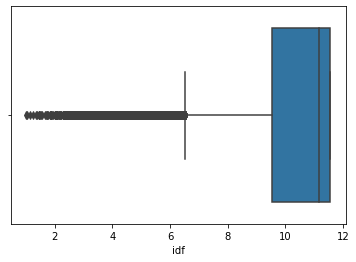

In [0]:
import seaborn as sns
sns.boxplot(word_Idf['idf'],orient='h')

In [0]:
sns.kdeplot(sorted(word_Idf['idf'],reverse=False))

In [0]:

print("25 precentile",np.percentile(idf,25))
print("50 Precentile",np.percentile(idf,50))
print("75 Precentile",np.percentile(idf,75))
print("90 precentile",np.percentile(idf,90))
print("75 Percentitle",np.percentile(idf,100))

25 precentile 9.536655891662718
50 Precentile 11.146093804096818
75 Precentile 11.551558912204982
90 precentile 11.551558912204982
75 Percentitle 11.551558912204982


In [0]:
word_idf=word_Idf[word_Idf['idf']>=np.percentile(idf,2)]
word_idf=word_idf[word_idf['idf']<=np.percentile(idf,10)]
word_idf.shape

(3932, 2)

In [0]:
word_idf=word_idf.sort_values(by='idf')
word_idf

,words,idf
6300,brains,4.934156
6930,busy,4.935494
46629,varying,4.936833
25775,line,4.936833
42083,style,4.938175
...,...,...
45516,ukulele,7.508508
7324,capital,7.508508
16662,farmers,7.508508
6661,buckets,7.508508


In [0]:
words=word_idf['words'].values
def remove_idf_words(data):
  preprocessed_essay=[]
  for sentence in data.values:
      sent = ' '.join(e for e in sentence.split() if e in words)
      preprocessed_essay.append(sent.strip())
  return preprocessed_essay

In [0]:
x_train['essay']=remove_idf_words(x_train['essay'])
x_test['essay']=remove_idf_words(x_test['essay'])

In [0]:
x_train=pd.read_csv('/content/drive/My Drive/x_train.csv')
x_test=pd.read_csv('/content/drive/My Drive/x_test.csv')

In [0]:
train_text_encoded=custom_tokenize(x_train['essay'].astype(str))
test_text_encoded=custom_tokenize(x_test['essay'].astype(str))

In [0]:
from keras.preprocessing.sequence import pad_sequences
max_len=110
train_text_data=pad_sequences(train_text_encoded,maxlen=max_len)
test_text_data=pad_sequences(test_text_encoded,maxlen=max_len)
print(train_text_data.shape)
print(test_text_data.shape)

(76473, 110)
(32775, 110)


In [0]:

print(school_state_one_hot_train.reshape(-1,1).shape)
print(max(school_state_one_hot_train))
print(school_state_one_hot_test.reshape(-1,1).shape)
print(max(school_state_one_hot_test))


print(subcategories_one_hot_train.reshape(-1,1).shape)
print(max(subcategories_one_hot_train))
print(subcategories_one_hot_test.reshape(-1,1).shape)
print(max(subcategories_one_hot_test))
print(categories_one_hot_train.reshape(-1,1).shape)
print(max(categories_one_hot_train))
print(categories_one_hot_test.reshape(-1,1).shape)
print(max(categories_one_hot_test))

print(grade_cat_one_hot_train.reshape(-1,1).shape)
print(max(grade_cat_one_hot_train))
print(grade_cat_one_hot_test.reshape(-1,1).shape)
print(max(grade_cat_one_hot_test))

print(teacher_prefix_one_hot_train.reshape(-1,1).shape)
print(max(teacher_prefix_one_hot_train))
print(teacher_prefix_one_hot_test.reshape(-1,1).shape)
print(max(teacher_prefix_one_hot_test))

(76473, 1)
50
(32775, 1)
50
(76473, 1)
391
(32775, 1)
391
(76473, 1)
50
(32775, 1)
50
(76473, 1)
3
(32775, 1)
3
(76473, 1)
4
(32775, 1)
4


In [0]:


embedding_layer = Embedding(input_dim=embedding_matrix.shape[0],
                            output_dim=embedding_matrix.shape[1], 
                            input_shape=(76,),
                            weights=[embedding_matrix], 
                            trainable=False, 
                            name='embedding_layer')
text_input=Input(shape=(110,))
text_embedding=embedding_layer(text_input)
lstm_layer=LSTM(200,return_sequences=True,dropout=0.4)(text_embedding)
flatten_lstm=Flatten()(lstm_layer)

state_input=Input(shape=(1,))
state_embedding=Embedding(51,25,input_length=1)(state_input)
flatten_state=Flatten()(state_embedding)

grade_input=Input(shape=(1,))
grade_embedding=Embedding(5,2,input_length=1)(grade_input)
flatten_grade=Flatten()(grade_embedding)

categorie_input=Input(shape=(1,))
categories_embedding=Embedding(51,4,input_length=1)(categorie_input)
flatten_categories=Flatten()(categories_embedding)

subcategories_input=Input(shape=(1,))
subcategories_embedding=Embedding(392,140,input_length=1)(subcategories_input)
flatten_subcategories=Flatten()(subcategories_embedding)


prefix_input=Input(shape=(1,))
prefix_embedding=Embedding(5,3,input_length=1)(prefix_input)
flatten_prefix=Flatten()(prefix_embedding)

numerical_input=Input(shape=(2,))
numerical_layer=Dense(24,activation='relu')(numerical_input)





concate_input=keras.layers.concatenate([flatten_lstm,flatten_state,flatten_grade,flatten_categories,flatten_subcategories,flatten_prefix,numerical_layer])
x=Dense(512,activation='relu')(concate_input)
x=Dropout(rate=0.5)(x)
x=Dense(128,activation='relu')(x)
x=Dropout(rate=0.2)(x)
x=Dense(64,activation='relu')(x)
main_out=Dense(2,activation='softmax')(x)




model=Model(inputs=[text_input,state_input,grade_input,categorie_input,subcategories_input,prefix_input,numerical_input],output=[main_out])

histroy=model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['acc',auc])
#tensorboard_callback = tensorflow.python.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=0, write_graph=True,write_grads=True)

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=[<tf.Tenso...)`


In [0]:
model.summary()

In [0]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 110)          0                                            
__________________________________________________________________________________________________
embedding_layer (Embedding)     (None, 110, 300)     120000300   input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 1)            0                                            
____________________________________________________________________________________________

In [0]:

model.fit([train_text_data,school_state_one_hot_train,grade_cat_one_hot_train,\
           categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,numerical_train_data],y_train,batch_size=300,epochs=5,verbose=1,callbacks=[tensorboard_callback],validation_data=([test_text_data,school_state_one_hot_test,grade_cat_one_hot_test,categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,numerical_test_data],y_test))

Train on 76473 samples, validate on 32775 samples
Epoch 1/5
76473/76473 [==============================] - 676s 9ms/step - loss: 0.4410 - acc: 0.8463 - auc: 0.5780 - val_loss: 0.4117 - val_acc: 0.8487 - val_auc: 0.6610
Epoch 2/5
76473/76473 [==============================] - 680s 9ms/step - loss: 0.4121 - acc: 0.8485 - auc: 0.6418 - val_loss: 0.4032 - val_acc: 0.8487 - val_auc: 0.6673
Epoch 3/5
76473/76473 [==============================] - 680s 9ms/step - loss: 0.4050 - acc: 0.8485 - auc: 0.6642 - val_loss: 0.4053 - val_acc: 0.8487 - val_auc: 0.6706
Epoch 4/5
76473/76473 [==============================] - 679s 9ms/step - loss: 0.3992 - acc: 0.8485 - auc: 0.6815 - val_loss: 0.4134 - val_acc: 0.8488 - val_auc: 0.6706
Epoch 5/5
76473/76473 [==============================] - 681s 9ms/step - loss: 0.3933 - acc: 0.8484 - auc: 0.7000 - val_loss: 0.4055 - val_acc: 0.8486 - val_auc: 0.6721


In [0]:
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

# Model 3

In [0]:
from sklearn.preprocessing import LabelEncoder
labelen=LabelEncoder()
labelen.fit(x_train['school_state'])
school_state_one_hot_train = labelen.transform(x_train['school_state']).reshape(-1,1)
school_state_one_hot_test  = labelen.transform(x_test['school_state']).reshape(-1,1)

In [0]:

vectorizer=LabelEncoder()
vectorizer.fit(x_train['clean_categories'])

categories_one_hot_train=vectorizer.transform(x_train['clean_categories'].values).reshape(-1,1)
categories_one_hot_test=vectorizer.transform(x_test['clean_categories'].values).reshape(-1,1)


In [0]:
vectorizer.fit(x_train['clean_subcategories'])
label_encoded = dict(zip(vectorizer.classes_, vectorizer.transform(vectorizer.classes_)))
subcategories_one_hot_train=vectorizer.transform(x_train['clean_subcategories']).reshape(-1,1)
not_label_cat=0
subcategories_one_hot_test=[]
for cat in x_test['clean_subcategories'].values:
  if cat in label_encoded.keys():
    subcategories_one_hot_test.append(label_encoded[cat])
  else:
    subcategories_one_hot_test.append(not_label_cat)
    not_label_cat-=1
subcategories_one_hot_test=np.array(subcategories_one_hot_test).reshape(-1,1)



In [0]:
vectorizer=LabelEncoder()
vectorizer.fit(x_train['teacher_prefix'])

teacher_prefix_one_hot_train=vectorizer.transform(x_train['teacher_prefix']).reshape(-1,1)
teacher_prefix_one_hot_test=vectorizer.transform(x_test['teacher_prefix']).reshape(-1,1)

In [0]:
vectorizer=LabelEncoder()
vectorizer.fit(x_train['project_grade_category'])
grade_cat_one_hot_train=vectorizer.transform(x_train['project_grade_category']).reshape(-1,1)
grade_cat_one_hot_test=vectorizer.transform(x_test['project_grade_category']).reshape(-1,1)

In [31]:

print(school_state_one_hot_train.shape)
print(max(school_state_one_hot_train))
print(school_state_one_hot_test.shape)
print(max(school_state_one_hot_test))


print(subcategories_one_hot_train.shape)
print(max(subcategories_one_hot_train))
print(subcategories_one_hot_test.shape)
print(max(subcategories_one_hot_test))
print(categories_one_hot_train.shape)
print(max(categories_one_hot_train))
print(categories_one_hot_test.shape)
print(max(categories_one_hot_test))

print(grade_cat_one_hot_train.shape)
print(max(grade_cat_one_hot_train))
print(grade_cat_one_hot_test.shape)
print(max(grade_cat_one_hot_test))

print(teacher_prefix_one_hot_train.shape)
print(max(teacher_prefix_one_hot_train))
print(teacher_prefix_one_hot_test.shape)
print(max(teacher_prefix_one_hot_test))

(76473, 1)
[50]
(32775, 1)
[50]
(76473, 1)
[391]
(32775, 1)
[391]
(76473, 1)
[50]
(32775, 1)
[50]
(76473, 1)
[3]
(32775, 1)
[3]
(76473, 1)
[4]
(32775, 1)
[4]


In [32]:
from sklearn.preprocessing import Normalizer
normalizer=Normalizer()
normalizer.fit(x_train['price'].values.reshape(-1,1))
price_one_hot_train = normalizer.transform(x_train['price'].values.reshape(-1,1)) 
price_one_hot_test = normalizer.transform(x_test['price'].values.reshape(-1,1)) 
 
normalizer.fit(x_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
project_no_one_hot_train=normalizer.transform(x_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

project_no_one_hot_test=normalizer.transform(x_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
print(price_one_hot_train.shape)
print(price_one_hot_test.shape)
print(project_no_one_hot_train.shape)
print(project_no_one_hot_test.shape)
vectorizer=LabelEncoder()
vectorizer.fit(x_train['clean_categories'])

categories_one_hot_train=vectorizer.transform(x_train['clean_categories'].values).reshape(-1,1)
categories_one_hot_test=vectorizer.transform(x_test['clean_categories'].values).reshape(-1,1)


(76473, 1)
(32775, 1)
(76473, 1)
(32775, 1)


In [33]:
numerical_train_data=np.hstack((price_one_hot_train,project_no_one_hot_train))
numerical_test_data=np.hstack((price_one_hot_test,project_no_one_hot_test))
print(numerical_train_data.shape)
print(numerical_test_data.shape)

(76473, 2)
(32775, 2)


In [0]:
from tensorflow.python.keras.utils import to_categorical
y_train=to_categorical(y_train,num_classes=2)
y_test=to_categorical(y_test,num_classes=2)

In [0]:
from sklearn.metrics import roc_auc_score
import tensorflow as tf
def auc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [35]:
from scipy.sparse import hstack
other_than_text_train_data=np.hstack((school_state_one_hot_train,grade_cat_one_hot_train,\
           categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,price_one_hot_train,project_no_one_hot_train))
other_than_text_test_data=np.hstack((school_state_one_hot_test,grade_cat_one_hot_test,categories_one_hot_test,\
                                subcategories_one_hot_test,teacher_prefix_one_hot_test,numerical_test_data))
print(other_than_text_train_data.shape)
print(other_than_text_test_data.shape)

(76473, 7)
(32775, 7)


In [36]:
from numpy import newaxis
other_than_text_test_data=other_than_text_test_data[:,:,newaxis]
other_than_text_train_data=other_than_text_train_data[:,:,newaxis]
print(other_than_text_train_data.shape)
print(other_than_text_test_data.shape)

(76473, 7, 1)
(32775, 7, 1)


In [38]:
from keras.layers import Conv1D
import tensorflow
embedding_layer = Embedding(input_dim=embedding_matrix.shape[0],
                            output_dim=embedding_matrix.shape[1], 
                            input_shape=(335,),
                            weights=[embedding_matrix], 
                            trainable=False, 
                            name='embedding_layer')
text_input=Input(shape=(335,))
text_embedding=embedding_layer(text_input)
lstm_layer=LSTM(150,return_sequences=True,activation='relu',dropout=0.35)(text_embedding)
flatten_lstm=Flatten()(lstm_layer)

other_than_text=Input(shape=(7,1),name='Other_than_text')
con1d_1=Conv1D(kernel_size = 50, filters = 10,padding='same',
                 activation='sigmoid',
                 strides=1,name='Conv_1')(other_than_text)
con1d_2=Conv1D(kernel_size = 50, filters = 10,padding='same',activation='sigmoid',
               strides=1,name='Conv_2')(con1d_1)
flatten_data=Flatten()(con1d_2)
concatenate_data=keras.layers.concatenate([flatten_lstm,flatten_data])
x=Dense(32,activation='relu',kernel_initializer='he_normal')(concatenate_data)
x=Dropout(rate=0.5)(x)
x=Dense(32,activation='relu',kernel_initializer='he_normal')(x)
x=Dropout(rate=0.5)(x)
x=Dense(32,activation='relu',kernel_initializer='he_normal')(x)
main_out=Dense(2,activation='softmax')(x)

model=Model(inputs=[text_input,other_than_text],output=[main_out])



histroy=model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['acc',auc])

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=0)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=[<tf.Tenso...)`


In [0]:
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 335)          0                                            
__________________________________________________________________________________________________
Other_than_text (InputLayer)    (None, 7, 1)         0                                            
__________________________________________________________________________________________________
embedding_layer (Embedding)     (None, 335, 300)     120000300   input_11[0][0]                   
__________________________________________________________________________________________________
Conv_1 (Conv1D)                 (None, 7, 10)        510         Other_than_text[0][0]            
____________________________________________________________________________________________

In [39]:
histroy=model.fit([train_text_data,other_than_text_train_data],y_train,epochs=5,batch_size=300,callbacks=[tensorboard_callback],validation_data=([test_text_data,other_than_text_test_data],y_test),use_multiprocessing=True)

Train on 76473 samples, validate on 32775 samples
Epoch 1/5
76473/76473 [==============================] - 1325s 17ms/step - loss: 0.4800 - acc: 0.8319 - auc: 0.5663 - val_loss: 0.4135 - val_acc: 0.8487 - val_auc: 0.6859
Epoch 2/5
76473/76473 [==============================] - 1314s 17ms/step - loss: 0.4164 - acc: 0.8485 - auc: 0.6134 - val_loss: 0.4077 - val_acc: 0.8487 - val_auc: 0.7171
Epoch 3/5
76473/76473 [==============================] - 1312s 17ms/step - loss: 0.4093 - acc: 0.8485 - auc: 0.6397 - val_loss: 0.4200 - val_acc: 0.8487 - val_auc: 0.6850
Epoch 4/5
76473/76473 [==============================] - 1314s 17ms/step - loss: 0.4050 - acc: 0.8485 - auc: 0.6606 - val_loss: 0.4285 - val_acc: 0.8487 - val_auc: 0.6129
Epoch 5/5
76473/76473 [==============================] - 1319s 17ms/step - loss: 0.4010 - acc: 0.8485 - auc: 0.6762 - val_loss: 0.4395 - val_acc: 0.8487 - val_auc: 0.6153


In [42]:
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.